You need to install tensorflow in order to run this code, you can do it with pip: "python3 -m pip install tensorflow" and findiff package for finite-difference methods "pip install --upgrade findiff"

In [50]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.signal import savgol_filter
import findiff as fd

# Training

In the code sigma_w and sigma_b are actually squared values, but it's easier to write without square.

In [2]:
def get_accuracy(sigma_w, L):
    sigma_b = 0.0
    N = 8 #width of the hidden layers

    # probability distribution for the second and later hidden layers
    w_init = keras.initializers.RandomNormal(mean=0., stddev=np.sqrt(sigma_w/N))
    # probability distribution for the first layer
    w_init_first = keras.initializers.RandomNormal(mean=0., stddev=np.sqrt(sigma_w/(28*28)))
    # probability distribution for the bias
    b_init = keras.initializers.RandomNormal(mean=0., stddev=np.sqrt(sigma_b))

    # here I am creating a model that I am going to train
    model = keras.Sequential()
    model.add(keras.Input(shape=input_shape))
    model.add(layers.Flatten())
    for i in range(L):
        if i == 0:
            model.add(layers.Dense(N, activation='tanh', kernel_initializer=w_init_first, bias_initializer=b_init))
        else:
            model.add(layers.Dense(N, activation='tanh', kernel_initializer=w_init, bias_initializer=b_init))

    model.add(layers.Dense(num_classes, activation='softmax', kernel_initializer=w_init, bias_initializer=b_init))

    # you can play here with batch_size, epochs, laerning rate and momentum
    batch_size = 64
    epochs = 100    
    optimizer = keras.optimizers.SGD(learning_rate=1e-3, momentum=0.8)
    model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

    # this part here is for creating checkpoints as I train, so that later I can plot accuracy over training and look at
    # neuron distributions
    sigma_w_txt = '{:.3f}'.format(sigma_w)

    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        'checkpoints/Model{epoch:08d}-'+sigma_w_txt+'.h5',
        save_weights_only=False,
        # 5 here is after how many epochs you want to save, so here after every 5th
        save_freq=5*(x_train.shape[0] // batch_size)) 

    # this is a callback that ensures that if NaN occurs it terminates further training
    term = tf.keras.callbacks.TerminateOnNaN()
    # this callback is for early stopping, so it waits 10 epochs and if accuracy doesn't change by 0.002 it stops
    earlyStop = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=10, min_delta=0.002)

    history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.1, callbacks=[term, model_checkpoint_callback])

    score = model.evaluate(x_test, y_test, verbose=0)

    # I am returning the accuracy after the end of training and also the complete history (there is actually the history of
    # accuracy in here as well, but I didn't use it)
    return score, history.history

In [32]:
# here I am loading MNIST data and rescaling so it's in the [0,1] range
num_classes = 10
input_shape = (28, 28, 1)

(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

x_train = x_train.astype("float32") / 255
x_test = x_test.astype("float32") / 255

x_train = np.expand_dims(x_train, -1)
x_test = np.expand_dims(x_test, -1)

y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

# these are the sigma^2_w over which I am going to scan
sws = np.linspace(0.1, 100, 100)

score = []

In [ ]:
for x in sws:
    score += [x, 1, *get_accuracy(x, 1)]

# at the end I convert the result in a numpy array and save it
score = np.array(score)
np.save('accuracySlice.npy', score)

# Results

These are the results after training for 100 epochs with a stopping condition

In [19]:
example_data = np.load('data/b0/accuracySlice.npy', allow_pickle=True).reshape(-1,4)

Data is in a bit of strange format, so I will go over it to make things clear

In [20]:
print(example_data[0][0]) # this is sigma_w^2 for which the network was trained
print(example_data[0][1]) # this is L (depth) of the network
print(example_data[0][2]) # final loss and accuracy
# this is the complete hisotry, it's in a form of dictonary with values 'loss', 'accuracy', 'val_loss' and 'val_accuracy'
# where val means validation
print(example_data[0][3])

0.1
1
[0.2805885970592499, 0.9193999767303467]
{'loss': [2.0604803562164307, 1.5426442623138428, 1.161494255065918, 0.9382991790771484, 0.8027870655059814, 0.7113181352615356, 0.645319938659668, 0.5957854986190796, 0.5575822591781616, 0.5272786617279053, 0.5028353333473206, 0.4827110767364502, 0.46570995450019836, 0.4513568580150604, 0.4389013946056366, 0.42796260118484497, 0.4184199273586273, 0.4098498225212097, 0.40213894844055176, 0.395100861787796, 0.3888969421386719, 0.38308197259902954, 0.37771841883659363, 0.37277287244796753, 0.3682331144809723, 0.3639686405658722, 0.36001288890838623, 0.35633397102355957, 0.3528607487678528, 0.349628210067749, 0.3465237021446228, 0.34368401765823364, 0.34087109565734863, 0.338392436504364, 0.3357885777950287, 0.3333304822444916, 0.33113202452659607, 0.3290044367313385, 0.32688620686531067, 0.32506242394447327, 0.32308632135391235, 0.32122305035591125, 0.31969666481018066, 0.31795457005500793, 0.3162205219268799, 0.31467071175575256, 0.31327611

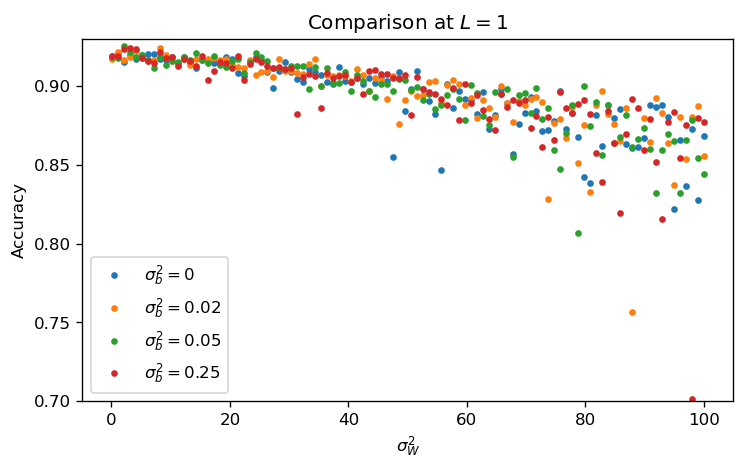

In [17]:
fig, ax1 = plt.subplots(figsize=(7,4), dpi=120)

sigmas = [0,0.02,0.05,0.25]

accuracy = np.zeros((len(sigmas), 100))
sigma_w = np.zeros_like(accuracy)

for j, sigma in enumerate(sigmas):
    data = np.load('data/b'+str(sigma)+'/accuracySlice.npy', allow_pickle=True).reshape(-1,4)
    for i, value in enumerate(data):
        accuracy[j,i] = value[2][1]
        sigma_w[j,i] = value[0]
    ax1.plot(sigma_w[j,:], accuracy[j,:],'.', label=r'$\sigma_b^2 = '+str(sigma)+'$')

ax1.set_ylabel('Accuracy')
ax1.set_xlabel(r'$\sigma_W^2$')
plt.title(r"Comparison at $L=1$")
ax1.set_ylim(0.7,0.93)
plt.legend()
#plt.savefig('NAME.pdf', dpi=150)
plt.show()

Now we can extract accuracy over training from history

In [28]:
bs = [0, 0.02, 0.05, 0.25]
accs = np.zeros((len(bs), 100, 100))

In [43]:
for i, b in enumerate(bs):
    data = np.load('data/b'+str(b)+'/accuracySlice.npy', allow_pickle=True).reshape(-1,4) 
    for j in range(100):
        accs[i,:,j] = data[j][3]['accuracy']

format of accs[i,j,k]: i is over different bs, j is over different epochs and k is over different ws

In [31]:
accs.shape

(4, 100, 100)

In [46]:
fig, axs = plt.subplots(1, 1, figsize=(6,4), dpi=150)

line1, = axs.plot([], [], '.b', label=r'$\sigma_b^2=$'+str(bs[0]))
line2, = axs.plot([], [], '.r', label=r'$\sigma_b^2=$'+str(bs[1]))
line3, = axs.plot([], [], '.g', label=r'$\sigma_b^2=$'+str(bs[2]))
line4, = axs.plot([], [], '.y', label=r'$\sigma_b^2=$'+str(bs[2]))

axs.set_xlim(sws[0]-1, sws[-1]+1)
axs.set_ylim(0.1, .93)
axs.set_ylabel("Accuracy")
axs.set_xlabel(r'$\sigma^2_w$')

def animate(frame_num):
    line1.set_data(sws, accs[0,frame_num,:])
    line2.set_data(sws, accs[1,frame_num,:])
    line3.set_data(sws, accs[2,frame_num,:])
    line4.set_data(sws, accs[3,frame_num,:])
    
    axs.set_title("Epoch " + str(frame_num))
    
    return (line1, line2, line3, line4)

axs.legend()
anim = FuncAnimation(fig, animate, frames=100, interval=300)
#anim.save('animation.mp4', writet='imagemagick')
html = HTML(anim.to_jshtml())
display(html)
plt.close()

# Derivatives

computing derivatives using Savitzky-Golay filter

In [51]:
derivative1 = savgol_filter(accs, 30, 15, deriv=1, delta = np.diff(sws)[0], axis=2, mode='interp')

In [53]:
fig, axs = plt.subplots(1, 1, figsize=(6,4), dpi=150)

line1, = axs.plot([], [], '.b', label=r'$\sigma_b^2=$'+str(bs[0]))
line2, = axs.plot([], [], '.r', label=r'$\sigma_b^2=$'+str(bs[1]))
line3, = axs.plot([], [], '.g', label=r'$\sigma_b^2=$'+str(bs[2]))
line4, = axs.plot([], [], '.y', label=r'$\sigma_b^2=$'+str(bs[2]))

axs.set_xlim(sws[0]-1, sws[-1]+1)
axs.set_ylim(-0.1, 0.1)
axs.set_ylabel("d/dw accuracy")
axs.set_xlabel(r'$\sigma^2_w$')

def animate(frame_num):
    line1.set_data(sws, derivative1[0,frame_num,:])
    line2.set_data(sws, derivative1[1,frame_num,:])
    line3.set_data(sws, derivative1[2,frame_num,:])
    line4.set_data(sws, derivative1[3,frame_num,:])
    
    axs.set_title("Epoch " + str(frame_num))
    
    return (line1, line2, line3, line4)

axs.legend()
anim = FuncAnimation(fig, animate, frames=100, interval=300)
#anim.save('animation.mp4', writet='imagemagick')
html = HTML(anim.to_jshtml())
display(html)
plt.close()

computing derivative using 16-point stencil

In [55]:
dw = fd.FinDiff(2, np.diff(sws)[0], 1, acc=16)
derivative2 = dw(accs)

In [57]:
fig, axs = plt.subplots(1, 1, figsize=(6,4), dpi=150)

line1, = axs.plot([], [], '.b', label=r'$\sigma_b^2=$'+str(bs[0]))
line2, = axs.plot([], [], '.r', label=r'$\sigma_b^2=$'+str(bs[1]))
line3, = axs.plot([], [], '.g', label=r'$\sigma_b^2=$'+str(bs[2]))
line4, = axs.plot([], [], '.y', label=r'$\sigma_b^2=$'+str(bs[2]))

axs.set_xlim(sws[0]-1, sws[-1]+1)
axs.set_ylim(-0.3, 0.3)
axs.set_ylabel("d/dw accuracy")
axs.set_xlabel(r'$\sigma^2_w$')

def animate(frame_num):
    line1.set_data(sws, derivative2[0,frame_num,:])
    line2.set_data(sws, derivative2[1,frame_num,:])
    line3.set_data(sws, derivative2[2,frame_num,:])
    line4.set_data(sws, derivative2[3,frame_num,:])
    
    axs.set_title("Epoch " + str(frame_num))
    
    return (line1, line2, line3, line4)

axs.legend()
anim = FuncAnimation(fig, animate, frames=100, interval=300)
#anim.save('animation.mp4', writet='imagemagick')
html = HTML(anim.to_jshtml())
display(html)
plt.close()

Fitting a linear line through data and plotting slope

In [59]:
slopes = np.zeros((4,100))
for i in range(4):
    for j in range(100):
        slopes[i, j] = np.polyfit(sws, accs[i,j,:], deg=1)[0]

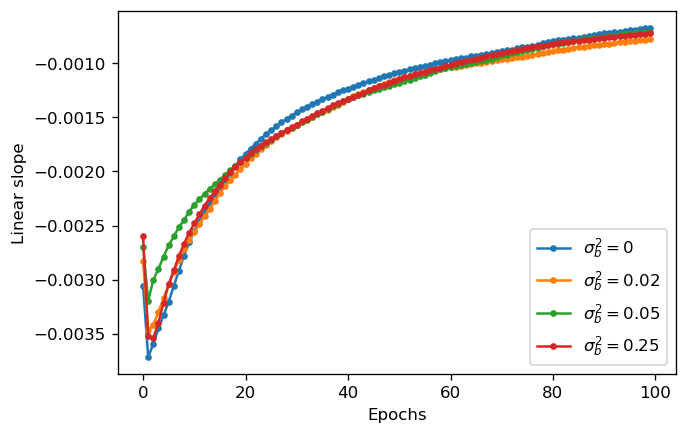

In [63]:
plt.figure(dpi=120)
for i in range(4):
    plt.plot(range(100), slopes[i,:], '.-', label=r'$\sigma_b^2=$'+str(bs[i]))
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Linear slope")
#plt.savefig("NAME.pdf")
plt.show()